**Goal**: to build a model to improve the Zestimate residual error.

# 1. EDA/Data Preprocessing
## Target 
- $logerror=log(Zestimate)−log(SalePrice)$

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
train = pd.read_csv('data/train_2016_v2.csv')
train.head(5)

,parcelid,logerror,transactiondate
0,11016594,0.0276,2016-01-01
1,14366692,-0.1684,2016-01-01
2,12098116,-0.0040,2016-01-01
3,12643413,0.0218,2016-01-02
4,14432541,-0.0050,2016-01-02


In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90275 entries, 0 to 90274
Data columns (total 3 columns):
parcelid           90275 non-null int64
logerror           90275 non-null float64
transactiondate    90275 non-null object
dtypes: float64(1), int64(1), object(1)
memory usage: 2.1+ MB


In [4]:
train.transactiondate = pd.to_datetime(train.transactiondate)

In [5]:
train.transactiondate.min(), train.transactiondate.max()

(Timestamp('2016-01-01 00:00:00'), Timestamp('2016-12-30 00:00:00'))

In [6]:
train.parcelid.nunique()

90150

- No missing values
- Most parcel IDs are unique.

### Log-error

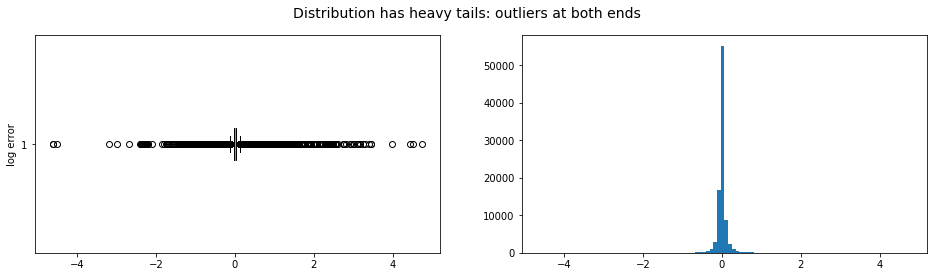

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
_ = axes[0].boxplot(train.logerror, vert=False)
_ = axes[0].set_ylabel('log error')

_ = axes[1].hist(train.logerror, bins=100)
_ = plt.suptitle('Distribution has heavy tails: outliers at both ends', fontsize=14)

#### Removing outliers

In [8]:
def find_outlier(x):
    Q1, Q3 = np.percentile(sorted(x), [25, 75])
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    return lower, upper

In [9]:
lower, upper = find_outlier(train.logerror)

In [10]:
lower, upper

(-0.12205, 0.13595000000000002)

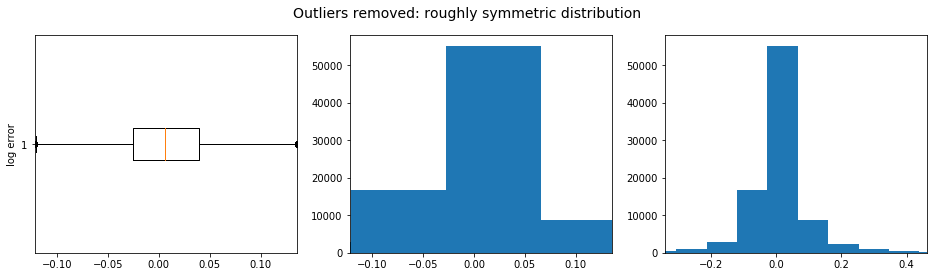

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
_ = axes[0].boxplot(train.logerror, vert=False)
_ = axes[0].set_ylabel('log error')
_ = axes[0].set_xlim(lower, upper)

_ = axes[1].hist(train.logerror, bins=100)
_ = axes[1].set_xlim(lower, upper)

relaxed_lower, relaxed_upper = np.percentile(sorted(train.logerror), [1, 99])
_ = axes[2].hist(train.logerror, bins=100)
_ = axes[2].set_xlim(relaxed_lower, relaxed_upper)

_ = plt.suptitle('Outliers removed: roughly symmetric distribution', fontsize=14)

### Transaction Date

#### Number of transactions per month

In [12]:
train['transaction_month'] = train.transactiondate.dt.month

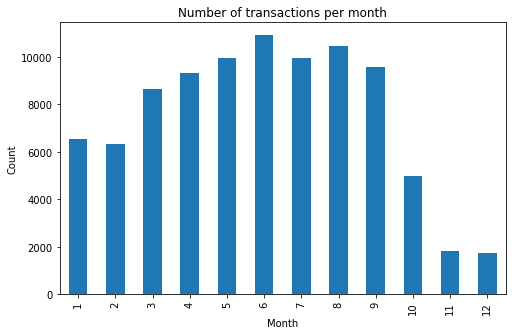

In [13]:
_ = train.transaction_month.value_counts(sort=False).plot(kind='bar', 
                                                          figsize=(8, 5),
                                                          title='Number of transactions per month')
_ = plt.xlabel('Month')
_ = plt.ylabel('Count')

- Much less transactions in the last three months
    - Provided in data description: the train data has all the transactions before October 15, 2016, plus some of the transactions after October 15, 2016.
- Less transactions in Jan/Feb.

## Features

In [14]:
prop = pd.read_csv('data/properties_2016.csv')

In [15]:
prop.head(3)

,parcelid,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,10754147,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
1,10759547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,27516.0,2015.0,27516.0,NaN,NaN,NaN,NaN
2,10843547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,650756.0,1413387.0,2015.0,762631.0,20800.37,NaN,NaN,NaN


In [16]:
prop.shape

(2985217, 58)

### Merging data
- To facilitate analysis and improve computational efficiency, we will merge `train` and `prop`. 

In [58]:
df = pd.merge(train.iloc[:, :-1], prop, on='parcelid', how='left')

In [59]:
# Divide by 10e5 to get the original values
df.longitude = df.longitude / 10e5
df.latitude = df.latitude  / 10e5

In [60]:
df.to_csv('data/zestimate.csv', index=False)

- We will not use `parcelid` and `transactiondate` as they were irrelevant to the task. 

In [61]:
df = df.drop(['parcelid', 'transactiondate'], axis=1)

In [62]:
df.shape

(90275, 58)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90275 entries, 0 to 90274
Data columns (total 58 columns):
logerror                        90275 non-null float64
airconditioningtypeid           28781 non-null float64
architecturalstyletypeid        261 non-null float64
basementsqft                    43 non-null float64
bathroomcnt                     90275 non-null float64
bedroomcnt                      90275 non-null float64
buildingclasstypeid             16 non-null float64
buildingqualitytypeid           57364 non-null float64
calculatedbathnbr               89093 non-null float64
decktypeid                      658 non-null float64
finishedfloor1squarefeet        6856 non-null float64
calculatedfinishedsquarefeet    89614 non-null float64
finishedsquarefeet12            85596 non-null float64
finishedsquarefeet13            33 non-null float64
finishedsquarefeet15            3564 non-null float64
finishedsquarefeet50            6856 non-null float64
finishedsquarefeet6        

In [28]:
df.head(3)

,logerror,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,0.0276,1.0,NaN,NaN,2.0,3.0,NaN,4.0,2.0,NaN,...,NaN,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,NaN,6.037107e+13
1,-0.1684,NaN,NaN,NaN,3.5,4.0,NaN,NaN,3.5,NaN,...,NaN,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN,NaN
2,-0.0040,1.0,NaN,NaN,3.0,2.0,NaN,4.0,3.0,NaN,...,NaN,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,NaN,6.037464e+13


In [31]:
y = df['logerror']
X = df.drop(['logerror'], axis=1)

### Missing values

In [32]:
missing_cnt = X.isnull().sum(axis=0).reset_index()
missing_cnt.columns = ['column', 'missing_count']
missing_cnt['missing_pct'] = round(missing_cnt['missing_count'] / len(X), 3)
missing_cnt = missing_cnt.sort_values(by='missing_count', ascending=False)
missing_cnt.head(20)

,column,missing_count,missing_pct
5,buildingclasstypeid,90259,1.000
12,finishedsquarefeet13,90242,1.000
2,basementsqft,90232,1.000
40,storytypeid,90232,1.000
45,yardbuildingsqft26,90180,0.999
48,fireplaceflag,90053,0.998
1,architecturalstyletypeid,90014,0.997
42,typeconstructiontypeid,89976,0.997
15,finishedsquarefeet6,89854,0.995
8,decktypeid,89617,0.993


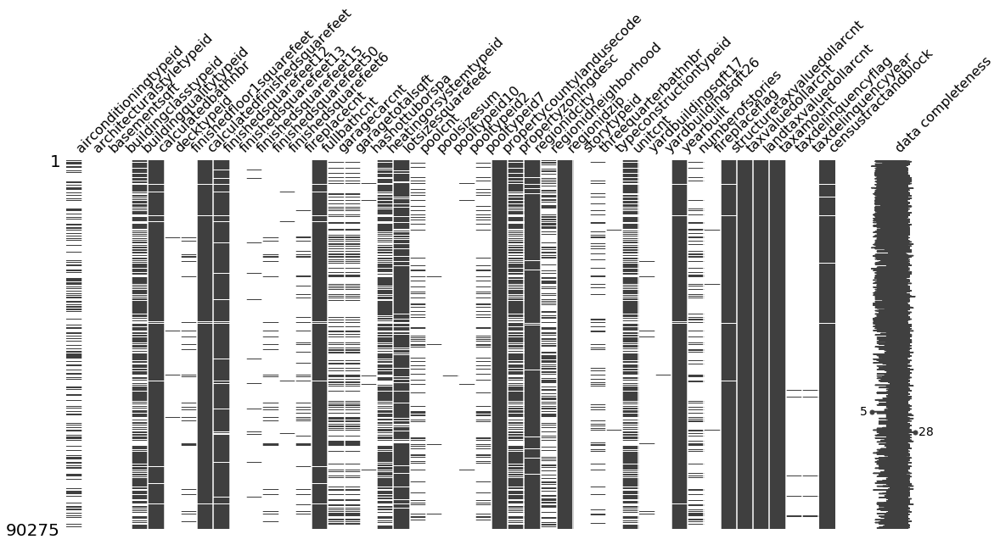

In [33]:
import missingno as msno

missing_col = list(X.columns[X.isnull().any()])
_ = msno.matrix(X[missing_col], figsize=(18, 8), labels=True, sparkline=True)

- Features like `buildingclasstypeid`, `finishedsquarefeet13`, `basementsqft` and `storytypeid` are almost missing everywhere.

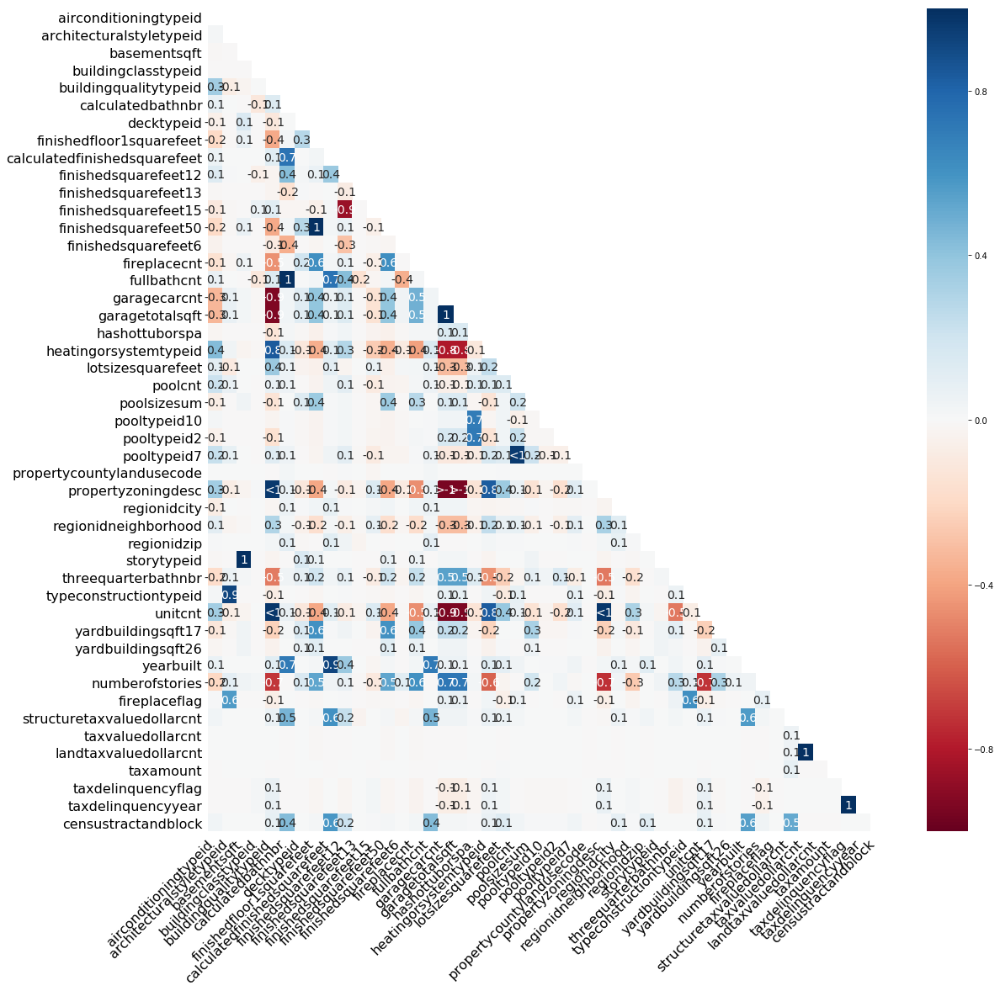

In [34]:
_ = msno.heatmap(df[missing_col], figsize=(18, 18))

- Some highly-correlated features in terms of missing values
    - Positive correlation: missing value in one feature means high likelihood of missing value in the other. For instance, if a house does not have bathroom, it will miss all bathroom-related features.
        - e.g., `fullbathcnt` vs. `calculatedbathnbr`, `garagecarcnt` vs. `garagetotalsqft`
    - Negative correlation
        - e.g., `buildingqualitytypeid` vs. `garagecarcnt`/`garagetotalsqft`

- Since we have a large feature pool, we will **drop features towards feature engineering** as we move along data preprocessing.
    - Remark: the high dimensionality of features can lead to slower training time and increased risk of overfitting. To help with these problems, feature selection is necessary.

#### Drop features with too many missing values, i.e., features with > 80% of missing values.

In [35]:
low_na = missing_cnt[missing_cnt['missing_pct'] < 0.8].column
X_low_na = X.loc[:, low_na]
print('Features with less than 80% of missing values:', X_low_na.shape[1])

Features with less than 80% of missing values: 33


### Data types

In [36]:
X_low_na.dtypes.value_counts().reset_index().rename(columns={'index':'data_type', 0:'count'})

,data_type,count
0,float64,31
1,object,2


- Of the remaining 33 features, 31 were continuous and 2 were categorical. 
- We will reclassify some features according to the data dictionary. Before that, let's look at the number of unique values for each continuous feature. 

In [37]:
X_low_na.select_dtypes(include='number').nunique()

numberofstories                     4
airconditioningtypeid               6
garagetotalsqft                   870
garagecarcnt                       15
regionidneighborhood              494
heatingorsystemtypeid              12
buildingqualitytypeid               8
unitcnt                            10
lotsizesquarefeet               20016
finishedsquarefeet12             4982
regionidcity                      177
calculatedbathnbr                  22
fullbathcnt                        14
yearbuilt                         130
calculatedfinishedsquarefeet     5102
censustractandblock             42398
structuretaxvaluedollarcnt      55450
regionidzip                       388
taxamount                       85110
taxvaluedollarcnt               55938
landtaxvaluedollarcnt           57066
rawcensustractandblock          42647
propertylandusetypeid              14
fips                                3
longitude                       71900
roomcnt                            17
latitude    

- Features with few unique values should be flagged for misclassification.

In [38]:
misclassified = ['airconditioningtypeid', 'regionidzip', 'fips', \
                 'propertylandusetypeid', 'heatingorsystemtypeid', \
                 'regionidneighborhood', 'regionidcity', 'regionidcounty', \
                 'yearbuilt', 'buildingqualitytypeid', ]

In [39]:
for col in misclassified:
    X_low_na[col] = X_low_na[col].astype(str) # use str to convert float

#### Drop constant features
- We do not want variables that do not vary at all.

In [40]:
for col in X_low_na.columns:
    if len(X_low_na[col].unique()) == 1:
        print('Feature', col, 'has only one value', X_low_na[col].unique())

Feature assessmentyear has only one value [2015.]


In [41]:
constant = ['assessmentyear']
X_low_na = X_low_na.drop(constant, axis=1)

#### Drop categorical features with too many categories.
- Categorical features with too many categories are usually not useful for predictive models.
- We want to cut down on categorical features as they will blow up the number of features once we apply one-hot encoding.

In [42]:
X_low_na.select_dtypes(exclude='number').nunique()

airconditioningtypeid           7
regionidneighborhood          495
heatingorsystemtypeid          13
buildingqualitytypeid           9
propertyzoningdesc           1996
regionidcity                  178
yearbuilt                     131
regionidzip                   389
propertycountylandusecode      77
propertylandusetypeid          14
fips                            3
regionidcounty                  3
dtype: int64

-  Given that we have roughly 90000 data points, a feature that has more than 900 categories will have less than 100 data points per category on average. Thus, we will drop `propertyzoningdesc` (Description of the allowed land uses (zoning) for that property).
- We will also drop `regionidneighborhood` and `regionidzip` to expedite training, as we have other geographical features with far less categories.

In [43]:
X_cleaned = X_low_na.drop(['propertyzoningdesc', 'regionidneighborhood', 'regionidzip'], axis=1)

In [44]:
X_cont = X_cleaned.select_dtypes(include = 'float')
X_cat = X_cleaned.select_dtypes(include = 'object')

In [45]:
# For categorical variables, treat NaN as category
fill_values = dict(zip(X_cat, ['missing'] * len(X_cat)))
X_cleaned = X_cleaned.fillna(value = fill_values)

In [46]:
X_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90275 entries, 0 to 90274
Data columns (total 29 columns):
numberofstories                 20570 non-null float64
airconditioningtypeid           90275 non-null object
garagetotalsqft                 29937 non-null float64
garagecarcnt                    29937 non-null float64
heatingorsystemtypeid           90275 non-null object
buildingqualitytypeid           90275 non-null object
unitcnt                         58353 non-null float64
lotsizesquarefeet               80125 non-null float64
finishedsquarefeet12            85596 non-null float64
regionidcity                    90275 non-null object
calculatedbathnbr               89093 non-null float64
fullbathcnt                     89093 non-null float64
yearbuilt                       90275 non-null object
calculatedfinishedsquarefeet    89614 non-null float64
censustractandblock             89670 non-null float64
structuretaxvaluedollarcnt      89895 non-null float64
taxamount       

### Visualization of geography
- We have data in three counties (Los Angeles, Orange and Ventura, California).

In [47]:
import plotly.graph_objects as go

mapbox_access_token = 'pk.eyJ1IjoibHVsbGFieTEwMjQiLCJhIjoiY2s4ZG1mNzNxMHZ1dTNmcXVsODQ3azdybSJ9.ejrwcISxoM5OZe4byXx9TA'

fig = go.Figure()

fig.add_trace(go.Scattermapbox(
        lat=X_cleaned.latitude,
        lon=X_cleaned.longitude,
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=5,
            opacity=0.4
        ),
    ))

fig.update_layout(
    title='Locations of Real Estate Properties',
    hovermode='closest',
    autosize=True,
    showlegend=False,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=(X_cleaned.latitude.max()+X_cleaned.latitude.min())/2,
            lon=(X_cleaned.longitude.max()+X_cleaned.longitude.min())/2
        ),
        pitch=0,
        zoom=7,
        style='light'
    ),
)

fig.show()

### Feature Engineering: Univariate Test
- With our cleaned data, we will deploy univariate tests to drive intuition for important features.

#### 1. F-regression

In [48]:
from sklearn.feature_selection import f_regression
from sklearn.impute import SimpleImputer

def compute_f(X, y):
    feature_names = X.columns
    X_imputed = SimpleImputer().fit_transform(X)
    F, p = f_regression(X_imputed, y)
    res = pd.DataFrame(zip(feature_names, F, p), 
                       columns=['feature', 'F_score', 'p_value']).sort_values('F_score', ascending = False)
    return res

In [49]:
f_reg = compute_f(X_cont, y)
f_reg[f_reg.p_value < 0.05]

,feature,F_score,p_value
5,finishedsquarefeet12,139.273107,4.053313e-32
8,calculatedfinishedsquarefeet,132.900837,9.987539e-31
6,calculatedbathnbr,74.717955,5.516827e-18
7,fullbathcnt,71.689053,2.556364e-17
19,bathroomcnt,70.270107,5.244741e-17
18,bedroomcnt,58.586599,1.964575e-14
10,structuretaxvaluedollarcnt,43.456029,4.359704e-11
2,garagecarcnt,14.669627,1.281804e-04
1,garagetotalsqft,11.892142,5.639696e-04
9,censustractandblock,7.034287,7.997768e-03


- Features such as finished square feet, bathroom count and assessed value of the built structure are significant.

#### 2. Mutual Information
- Due to computational cost, this method is only applied on significant features identified by F-test to check whether there is a conflict.

In [50]:
from sklearn.feature_selection import mutual_info_regression

def compute_mi(X, y):
    feature_names = X.columns
    X_imputed = SimpleImputer().fit_transform(X)
    scores = mutual_info_regression(X_imputed, y)
    res = pd.DataFrame(zip(feature_names, scores), 
                       columns=['feature', 'mutual_info']).sort_values('mutual_info', ascending = False)
    return res

In [51]:
mi = compute_mi(X_cont.loc[:, list(f_reg[f_reg.p_value < 0.05]['feature'])], y)
mi

,feature,mutual_info
9,censustractandblock,0.032954
10,rawcensustractandblock,0.032513
0,finishedsquarefeet12,0.022093
6,structuretaxvaluedollarcnt,0.016417
4,bathroomcnt,0.015909
8,garagetotalsqft,0.015244
2,calculatedbathnbr,0.014943
7,garagecarcnt,0.012458
1,calculatedfinishedsquarefeet,0.011729
11,taxamount,0.011347


- Census tract and block has higher rank while some area/bathroom related features are ranked lower.
- Since F-test only captures linear relationship, we will plot the scatterplot matrix to further investigate.

### Multicollinearity

In [52]:
import seaborn as sns

def plot_corr(X, figsize=20):
    
    corr = X.corr()

    plt.figure(figsize=(figsize, figsize))
    plt.title('Correlations Among Features', fontsize=20)

    ax = sns.heatmap(corr,
                     cmap='coolwarm', # sns.diverging_palette(20, 220, n=10),
                     square=True,
                     annot=True)
    plt.tight_layout()

    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    )
    
#     # Remove features with corr >= 0.9
#     columns = np.full((corr.shape[0],), True, dtype=bool)
#     for i in range(corr.shape[0]):
#         for j in range(i+1, corr.shape[0]):
#             if corr.iloc[i,j] >= 0.9:
#                 if columns[j]:
#                     columns[j] = False

#     return X.columns[columns]

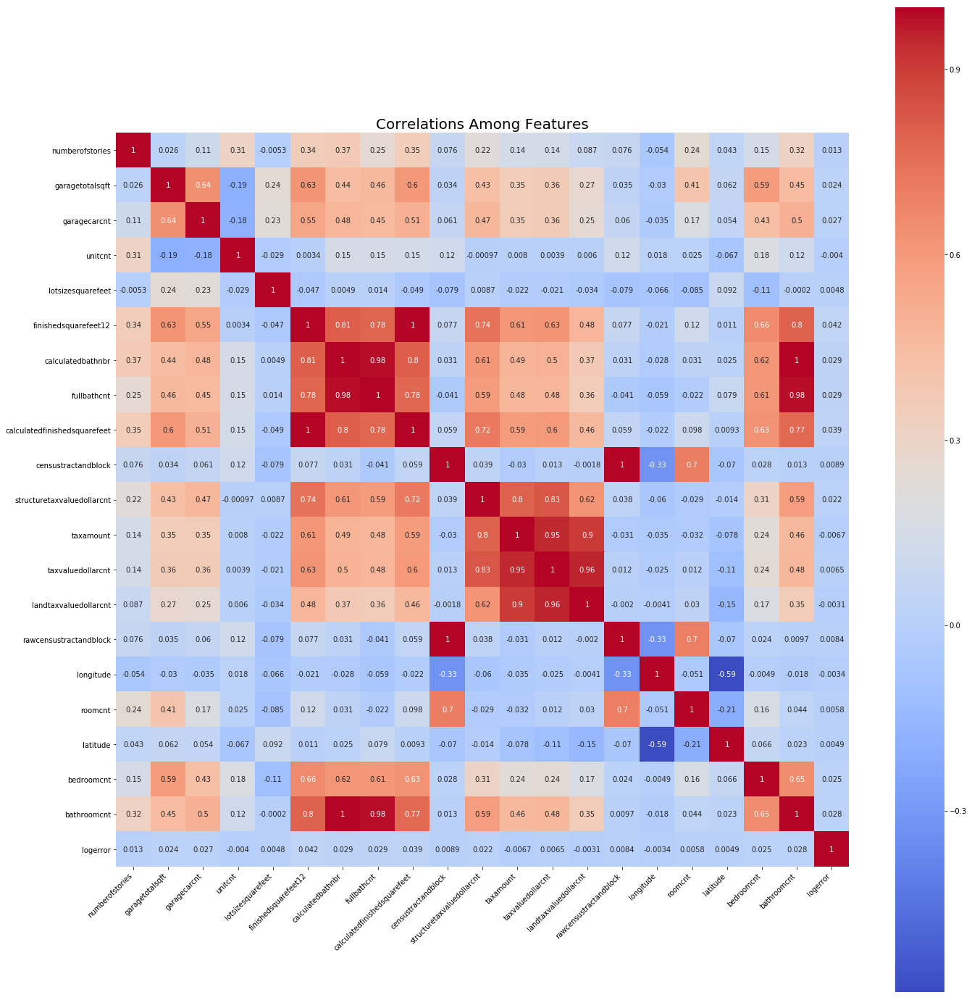

In [53]:
plot_corr(df[list(X_cont.columns) + ['logerror']])

- Significant positive correlation. Most correlations are quite self-explanatory as the features were measuring similar things.  
    - `censustractandblock`,`rawcensustractandblock`
    - `bathroomcnt`, `fullbathcnt`, `calculatedbathnbr`
    - `finishedsquarefeet12`, `calculatedfinishedsquarefeet`
    - `taxamount`, `landtaxvaluedollarcnt`, `taxvaluedollarcnt`
- Significant negative correlation: not observed

### Closer look at important features identified before
- For feature identified as important by both F-regression and Mutual Information.

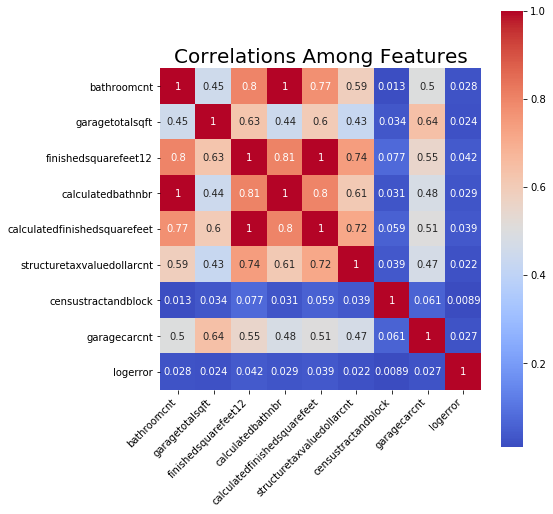

In [54]:
X_imp = list(set(f_reg[:10]['feature']).intersection(set(mi[:10]['feature'])))
plot_corr(df[X_imp + ['logerror']], figsize=8)

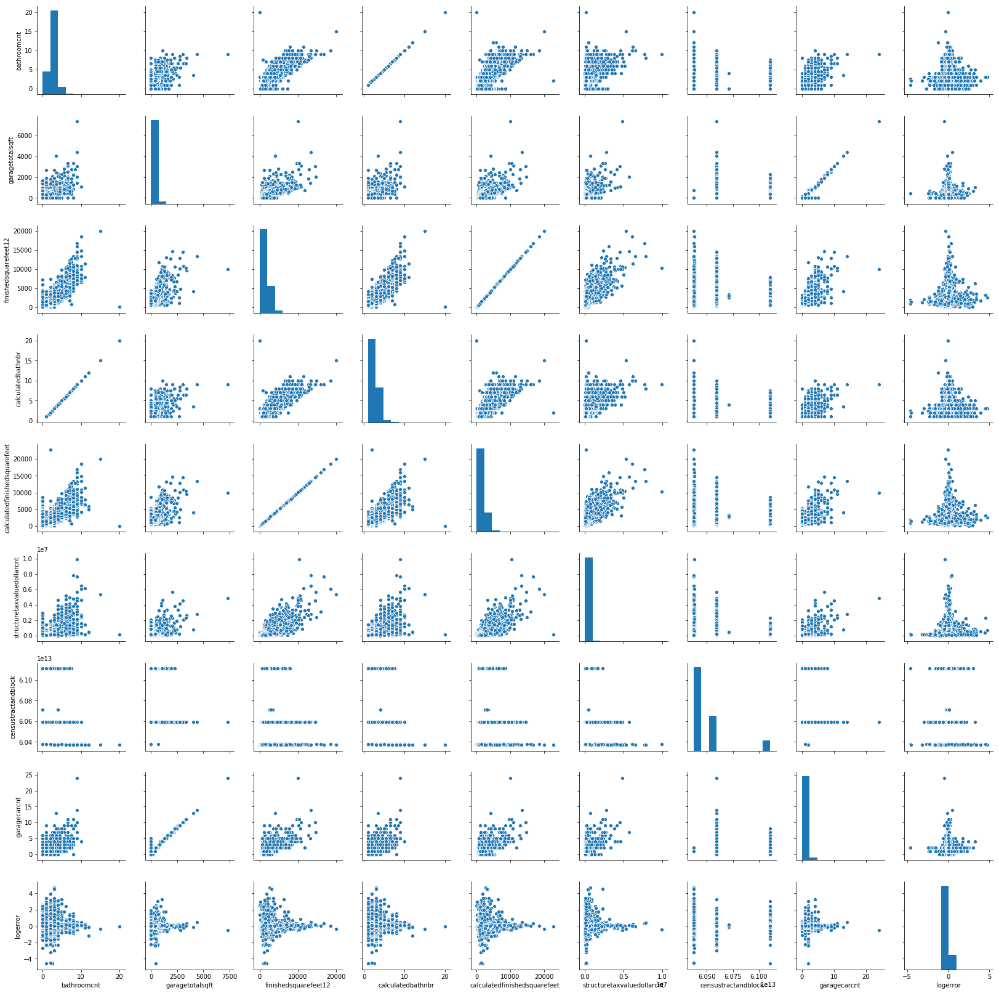

In [55]:
_ = sns.pairplot(df[X_imp + ['logerror']])

- From the scatterplot, the variance of `logerror` decreases with increase in all features.
- From the correlation heatmap, the correlation between `logerror` and all features are positive, i.e., a higher value in any of the features is associated with higher `logerror`.
- The distributions of `bathroomcnt`, `fullbathcnt` and `calculatedbathnbr` are similar.
- Almost perfect positive correlations for
    - `garagetotalsqft` and `garagecarcnt`
    - `bathroomcnt` and `calculatedbathnbr`
    - `calculatedfinishedsquarefeet` and `finishedsquarefeet12`

- Based on F-score, Mutual Information and correlation heatmap, the following features will be dropped towards feature engineering.
    - `bathroomcnt`, `fullbathcnt`
    - `calculatedfinishedsquarefeet`
    - `garagetotalsqft`
    - `rawcensustractandblock`
    - `landtaxvaluedollarcnt`, `taxvaluedollarcnt`

In [56]:
X_cleaned = X_cleaned.drop(['bathroomcnt', 'fullbathcnt', \
                            'calculatedfinishedsquarefeet', 'garagetotalsqft', \
                            'rawcensustractandblock', \
                            'landtaxvaluedollarcnt', 'taxvaluedollarcnt'], axis=1)

In [57]:
X_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90275 entries, 0 to 90274
Data columns (total 22 columns):
numberofstories               20570 non-null float64
airconditioningtypeid         90275 non-null object
garagecarcnt                  29937 non-null float64
heatingorsystemtypeid         90275 non-null object
buildingqualitytypeid         90275 non-null object
unitcnt                       58353 non-null float64
lotsizesquarefeet             80125 non-null float64
finishedsquarefeet12          85596 non-null float64
regionidcity                  90275 non-null object
calculatedbathnbr             89093 non-null float64
yearbuilt                     90275 non-null object
censustractandblock           89670 non-null float64
structuretaxvaluedollarcnt    89895 non-null float64
taxamount                     90269 non-null float64
propertycountylandusecode     90275 non-null object
propertylandusetypeid         90275 non-null object
fips                          90275 non-null objec

# Train-validation-split

In [50]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_cleaned, y, random_state=0)

# 2. Modeling
- Evaluation metric: Mean Absolute Error

In [51]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_validate
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from dirty_cat import TargetEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

def fit_model(X_train, y_train, model, cv=3, advanced_preprocess=False, 
              tuning=None, n_iter=5, params=None, plot=False):
    
    def plot_dependence(grid, params):
        _ = plt.figure(figsize=(10, 6))
        
        if len(params) == 1: # if there is one parameter to tune
            x_lab = list(params.keys())[0].split('__')[1]
            x_ticks = list(params.values())[0]

            for i in ['mean_train_score', 'mean_test_score']:
                _ = plt.plot(x_ticks, -grid.cv_results_[i], label = i)
                _ = plt.legend()
                _ = plt.xlabel(x_lab)
                _ = plt.ylabel('MAE')
        else:
            x_lab = list(params.keys())[0].split('__')[1]
            y_lab = list(params.keys())[1].split('__')[1]
            x_ticks, y_ticks = list(params.values())[0], list(params.values())[1]
            
            x = np.repeat(x_ticks, len(y_ticks), axis=0)
            y = np.tile(y_ticks, len(x_ticks))
            results = pd.DataFrame(grid.cv_results_)
            
            results[x_lab] = x
            results[y_lab] = y
            
            res = pd.pivot_table(results,
                                 values = 'mean_test_score',
                                 index=x_lab,
                                 columns=y_lab)

            _ = sns.heatmap(res, annot=True)
                
    categorical = X_train.dtypes == object
    low_card_cat = (X_train.dtypes == object) & (X_train.apply(pd.Series.nunique) < 10)
    high_card_cat = (X_train.dtypes == object) & (X_train.apply(pd.Series.nunique) >= 10)
    
    if advanced_preprocess: 
        '''
            For numerical features, (1) impute missing value with mean (2) StandardScaling.
            For categorical features, encode with respect to cardinality.
                low-cardinality -> OneHotEncoding,
                high-cardinality -> TargetEncoding
        '''
        preprocess = make_column_transformer(
            (make_pipeline(SimpleImputer(missing_values=np.nan, strategy='mean'), 
                               StandardScaler()), ~categorical),
            (OneHotEncoder(handle_unknown='ignore'), low_card_cat),
            (TargetEncoder(handle_unknown='ignore'), high_card_cat))
    else:
        '''
            For numerical features, impute missing value with mean.
            For categorical features, do OneHotEncoding.
        '''
        preprocess = make_column_transformer(
            (SimpleImputer(missing_values=np.nan, strategy='mean'), ~categorical),
            (OneHotEncoder(handle_unknown='ignore'), categorical)) 
             
    pipe = make_pipeline(preprocess, model)

    if tuning:
        if tuning == 'grid':
            grid = GridSearchCV(pipe, params, return_train_score=True,
                                scoring='neg_mean_absolute_error', 
                                cv=cv, n_jobs=-1)
        if tuning == 'random':
            # Use RandomSearchCV for efficiency. Randomly choose n_iter settings.
            grid = RandomizedSearchCV(pipe, params, return_train_score=True, 
                                      n_iter=n_iter, random_state=0,
                                      scoring='neg_mean_absolute_error', 
                                      cv=cv, n_jobs=-1)    
        grid.fit(X_train, y_train)
        print('Best parameters:', grid.best_params_)
        print('MAE:', -grid.best_score_)
       
        if plot:
            plot_dependence(grid, params)
        
        return grid
    
    scores = cross_validate(pipe, X_train, y_train, cv=cv, 
                            scoring='neg_mean_absolute_error')
    
    print('MAE:', -scores['test_score'].mean())

    pipe.fit(X_train, y_train)
    return pipe

## Baseline: linear regression (OLS)

In [52]:
from sklearn.linear_model import LinearRegression

base_pipe = fit_model(X_train, y_train, LinearRegression())

MAE: 0.06848350663521849


In [53]:
improved_base_pipe = fit_model(X_train, y_train, LinearRegression(), 
                               advanced_preprocess=True)

MAE: 0.06976331323426548


## Lasso, Ridge, ElasticNet

In [55]:
from sklearn.linear_model import Lasso, Ridge, ElasticNet
params_lasso = {'lasso__alpha': np.logspace(-3, 1, 10)}
lasso_pipe = fit_model(X_train, y_train, Lasso(), 
                       advanced_preprocess=True, 
                       tuning='random', params=params_lasso)

Best parameters: {'lasso__alpha': 0.0027825594022071257}
MAE: 0.06835572140614325


In [56]:
params_ridge = {'ridge__alpha': np.logspace(-3, 1, 10)}
ridge_pipe = fit_model(X_train, y_train, Ridge(), 
                       advanced_preprocess=True, 
                       tuning='random', params=params_ridge)

Best parameters: {'ridge__alpha': 10.0}
MAE: 0.06859673172973751


In [57]:
params_en =  {'elasticnet__alpha': np.logspace(-3, 1, 10),
              'elasticnet__l1_ratio': [.1, .5, .9]}
en_pipe = fit_model(X_train, y_train, ElasticNet(), 
                    advanced_preprocess=True, 
                    tuning='random', params=params_en)

Best parameters: {'elasticnet__l1_ratio': 0.9, 'elasticnet__alpha': 0.001}
MAE: 0.06841807666598343


# Decision Tree

In [58]:
from sklearn.tree import DecisionTreeRegressor
params_tree = {'decisiontreeregressor__max_depth': range(2, 5), 
               'decisiontreeregressor__max_features': ['sqrt', 'log2']}
tree_pipe = fit_model(X_train, y_train, DecisionTreeRegressor(criterion='mae', 
                                                              random_state=0, 
                                                              min_samples_split=10), 
                      advanced_preprocess=True, tuning='random', n_iter=2, 
                      params=params_tree)

Best parameters: {'decisiontreeregressor__max_features': 'sqrt', 'decisiontreeregressor__max_depth': 3}
MAE: 0.06814321570925062


# Ensemble: Random Forest, XGBoost 

In [59]:
from sklearn.ensemble import RandomForestRegressor
params_rf = {'randomforestregressor__n_estimators': [5, 10], 
             'randomforestregressor__max_depth': [4, 5], 
             'randomforestregressor__max_features': ['sqrt', 'log2']}
rf_pipe = fit_model(X_train, y_train, RandomForestRegressor(criterion='mae', 
                                                            random_state=0, 
                                                            min_samples_split=10), 
                    advanced_preprocess=True, 
                    tuning='random', n_iter=3, params=params_rf)

Best parameters: {'randomforestregressor__n_estimators': 10, 'randomforestregressor__max_features': 'sqrt', 'randomforestregressor__max_depth': 4}
MAE: 0.06800350843390797


In [60]:
from xgboost import XGBRegressor

params_xgb = {'xgbregressor__learning_rate': np.logspace(-2, 0, 5),
              'xgbregressor__max_depth': range(2, 6),
              'xgbregressor__gamma': [0.0, 0.2, 0.4]}
xgb_pipe = fit_model(X_train, y_train, XGBRegressor(random_state=0), 
                     advanced_preprocess=False, tuning='random', 
                     n_iter=5, params=params_xgb)

Best parameters: {'xgbregressor__max_depth': 2, 'xgbregressor__learning_rate': 0.1, 'xgbregressor__gamma': 0.2}
MAE: 0.06860105990497262


- Caveat of tree-based models: out-of-sample extrapolation
- Training is slow for tree-based models.
- Best model: random forest

# Feature Importance

In [127]:
def get_feature_names(X_train):
    # feature names for continuous variables
    X_cont = np.array(list(X_train.select_dtypes(exclude = 'object')))

    # feature names for categorical variables after encoding
    low_card_cat = (X_train.dtypes == object) & (X_train.apply(pd.Series.nunique) < 10)
    high_card_cat = (X_train.dtypes == object) & (X_train.apply(pd.Series.nunique) >= 10)
    
    names_raw = list(X_train.ix[:, low_card_cat.index[low_card_cat]].columns)
    # Prefix after one-hot-encoding
    prefix = ['x' + str(i) for i in range(len(low_card_names_raw))]
    names_map = dict(zip(prefix, names_raw))
    encoder = OneHotEncoder(handle_unknown='ignore')
    encoder.fit_transform(X_train.ix[:, low_card_cat.index[low_card_cat]])
    names_new = encoder.get_feature_names()
    # Map the prefix back to name, e.g., 'x0' -> 'airconditioningtypeid'
    for k, v in names_map.items():
        for i in range(len(names_new)):
            names_new[i] = names_new[i].replace(k, v)
    
    high_cat_names = np.array(high_card_cat.index[high_card_cat])

    new_X_cat = np.concatenate((names_new, high_cat_names), axis=None)

    # concatenate feature names
    features = np.concatenate((X_cont, new_X_cat), axis=None)
    
    return features

In [157]:
def feature_imp(pipe, model_type, features, X_train, y_train):
    # collect the best fit model
    m = pipe.best_estimator_
    m.fit(X_train, y_train)
    
    # collect feature importances/coefficients
    if model_type == 'tree':
        coef = m.steps[1][1].feature_importances_
    if model_type == 'linear':
        coef = m.steps[1][1].coef_

    # sort descendingly
    coef_idx = np.argsort(coef)[::-1]
    colors = ['tab:red' if c > 0 else 'tab:blue' for c in np.sort(coef)[::-1]]
    
    _ = plt.figure(figsize=(12, 6))
    _ = plt.bar(features[coef_idx], height=np.sort(coef)[::-1], color=colors)
    _ = plt.xlabel('Features')
    if model_type == 'tree':
        _ = plt.ylabel('Feature Importance')
    if model_type == 'linear':
        _ = plt.ylabel('Coefficients')
    _ = plt.title('Regressor: ' + str(m.steps[1][0]))
    _ = plt.xticks(rotation=90)
    
    print('Top 10 features:\n', features[coef_idx][:10])
    
    return m

In [158]:
feature_names = get_feature_names(X_train)

Top 10 features:
 ['finishedsquarefeet12' 'propertylandusetypeid' 'roomcnt'
 'airconditioningtypeid_5.0' 'airconditioningtypeid_3.0'
 'airconditioningtypeid_13.0' 'airconditioningtypeid_11.0'
 'airconditioningtypeid_1.0' 'bedroomcnt' 'latitude']


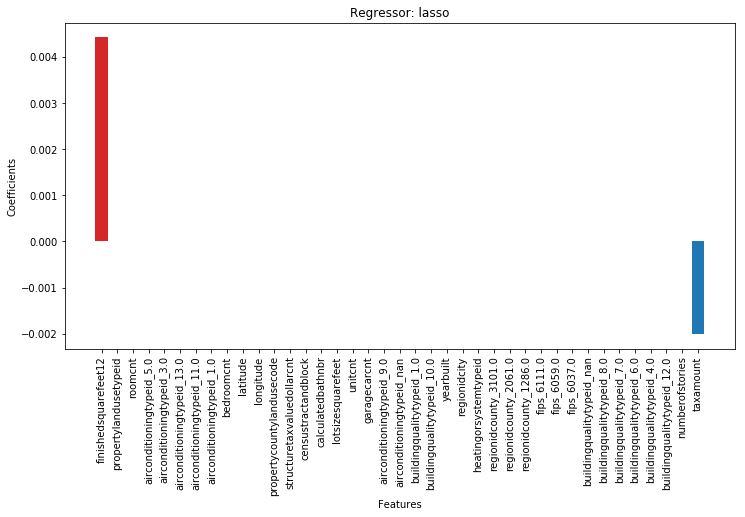

In [159]:
lasso_fitted = feature_imp(lasso_pipe, 'linear', feature_names, X_train, y_train)

Top 10 features:
 ['finishedsquarefeet12' 'taxamount' 'structuretaxvaluedollarcnt'
 'regionidcity' 'calculatedbathnbr' 'latitude' 'yearbuilt'
 'lotsizesquarefeet' 'garagecarcnt' 'propertycountylandusecode']


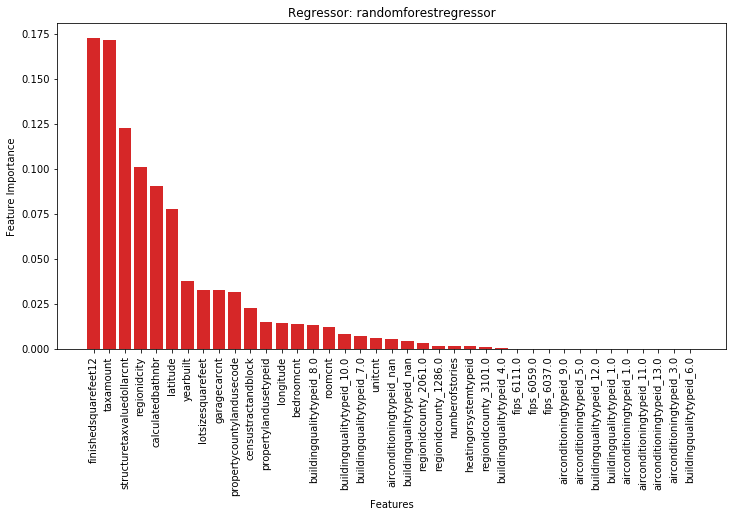

In [161]:
rf_fitted = feature_imp(rf_pipe, 'tree', feature_names, X_train, y_train)

- Most important features include `finishedsquarefeet12` and `taxamount`, so that living area and tax can have a large influence on `logerror`.

# A simple linear regression model

In [162]:
X_selected = ['finishedsquarefeet12', 'taxamount']

In [163]:
simple_linear = fit_model(X_train[X_selected], y_train, LinearRegression())

MAE: 0.06850939808174579


# 3. Test performance

In [165]:
from sklearn.metrics import mean_absolute_error

for m in [simple_linear, lasso_fitted, rf_fitted]:
    y_pred = m.predict(X_val)
    print('Model:', str(m.steps[1][0]))
    print('Test MAE:', mean_absolute_error(y_val, y_pred), '\n')

Model: linearregression
Test MAE: 0.06922105324581782 

Model: lasso
Test MAE: 0.06812787358063864 

Model: randomforestregressor
Test MAE: 0.06771420399663254 

